### **Digital Bookshelf: Book detection with PyTorch**

In [1]:
import torchvision
import torch

In [2]:
# pre-trained model
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
device = torch.device('cpu')
model.to(device)
model.eval()

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d()
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d()
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d()
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d()
          (relu): ReLU(inplace=True)
          (downsample): Sequent

In [3]:
from PIL import Image
import os 


# define dataset object 
class ShelfDataset:
    def __init__(self, root):
        self.root = root
        self.imgs = sorted([f for f in os.listdir(os.path.join(root, "bookshelfs_unlabelled")) 
                            if not f.startswith('.')])

    def __getitem__(self, idx):
        img_path = os.path.join(self.root, "bookshelfs_unlabelled", self.imgs[idx])
        img = Image.open(img_path).convert('RGB')
        tensor = torchvision.transforms.ToTensor()(img)
        unsqueze = tensor.unsqueeze_(0)
        return unsqueze


/Users/davisbrown/opt/anaconda3/envs/books/lib/python3.8/site-packages/torch/nn/functional.py:2854: UserWarning: The default behavior for interpolate/upsample with float scale_factor will change in 1.6.0 to align with other frameworks/libraries, and use scale_factor directly, instead of relying on the computed output size. If you wish to keep the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for interpolate/upsample with float scale_factor will change "
/Users/distiller/project/conda/conda-bld/pytorch_1587428077867/work/torch/csrc/utils/python_arg_parser.cpp:756: UserWarning: This overload of nonzero is deprecated:
	nonzero(Tensor input, *, Tensor out)
Consider using one of the following signatures instead:
	nonzero(Tensor input, *, bool as_tuple)


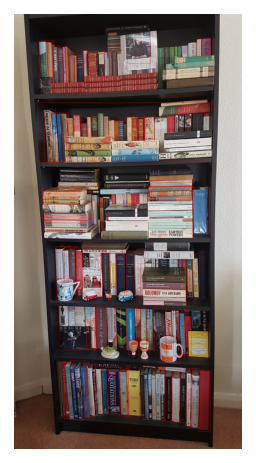

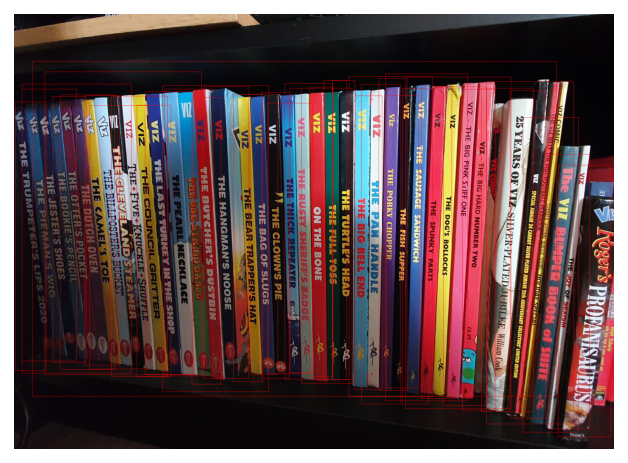

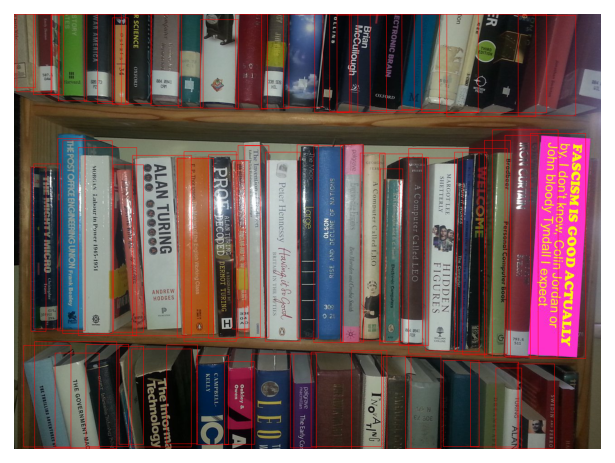

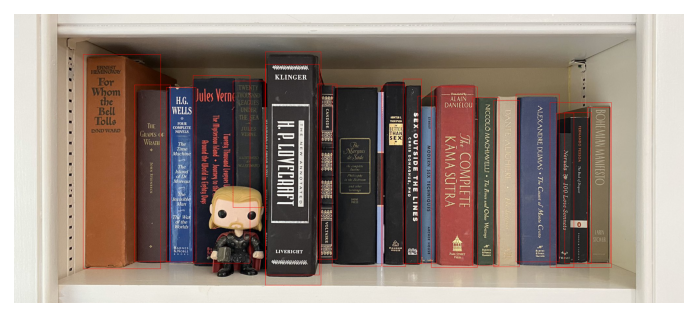

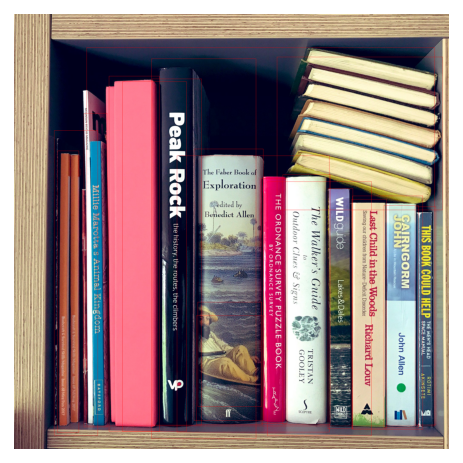

...

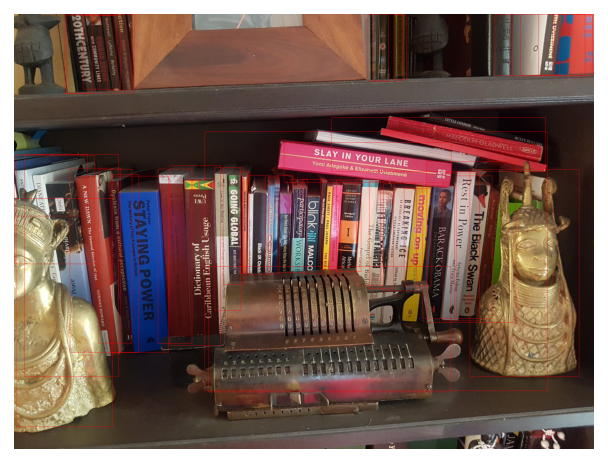

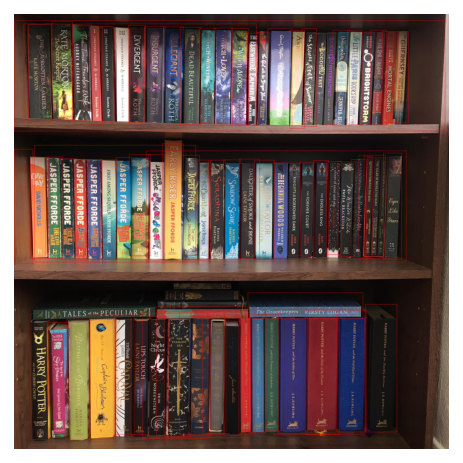

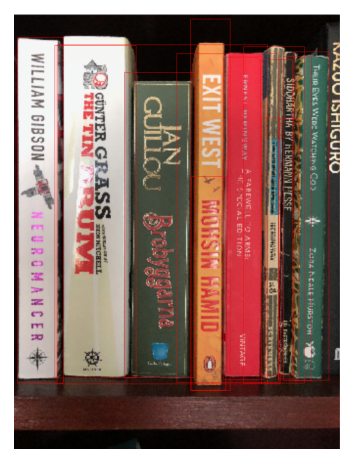

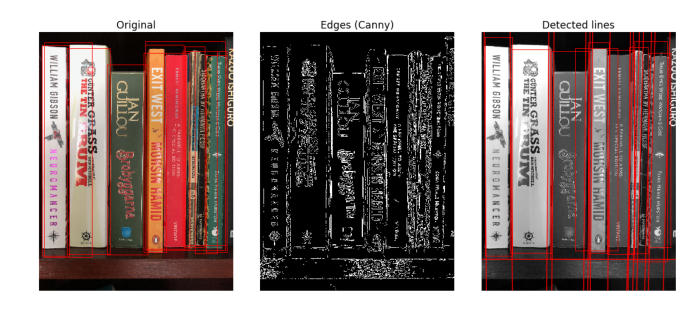

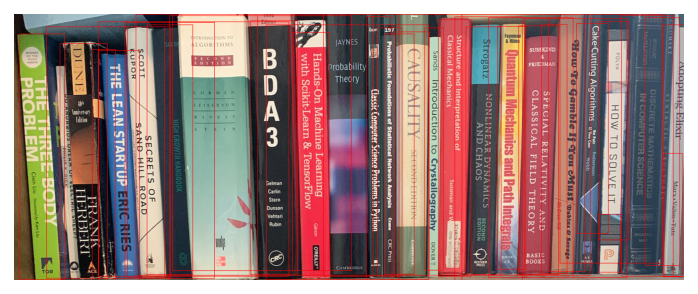

In [4]:
%config InlineBackend.figure_format = 'retina'
import matplotlib.pyplot as plt


bookshelfs = ShelfDataset('/Users/davisbrown/Desktop/SideProjects/bookRecognition')

for _, img in enumerate(bookshelfs):
    with torch.no_grad():
        prediction = model(img)


    #using PIL rather than cv2, similar syntax for both
    from PIL import Image, ImageDraw

    rects = prediction[0]['boxes']

    im = Image.fromarray(
        img.mul(255).byte()[0,...].permute(1, 2, 0).numpy()
    )

    for index, rect in enumerate(rects):
        if prediction[0]['scores'][index] > 0.4:
            xmin, ymin, xmax, ymax = (rect)
            draw = ImageDraw.Draw(im)
            draw.rectangle([(xmin, ymin), (xmax, ymax)], outline=(255))
            del draw
    plt.imshow(im)
    plt.axis('off')
    plt.show()